### 📘 Lesson 7: Hydropower Plant Modelling

<div style="display: flex; align-items: center; justify-content: space-between;">
  <div>
    <h3>Course presenters</h3>
    <ul>
      <li><strong>Priyesh Gosai</strong> - Energy Systems Modeler and Training Coordinator</li>
      <li><strong>Dr. Fabian Hofmann</strong> - Senior Optimization and Energy System Modelling Expert</li>
    </ul>
  </div>
  <div>
    <a href="https://openenergytransition.org/index.html">
      <img src="https://openenergytransition.org/assets/img/oet-logo-red-n-subtitle.png" height="60" alt="OET">
    </a>
  </div>
</div>


#### 🎯 Learning Objectives  



* Run a demonstration model using real data. 
* Solve the Day ahead and intra day model. 
* Analyse the results.

---

![TEPSCO_EDL_PyPSA Diagrams V0-Page-2.drawio.png](<attachment:TEPSCO_EDL_PyPSA Diagrams V0-Page-2.drawio.png>)
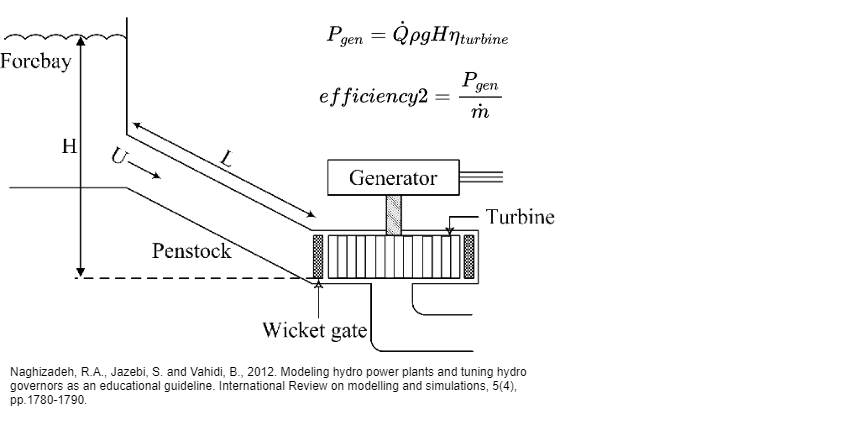

![TEPSCO_EDL_PyPSA Diagrams V0-Full Network.drawio.png](<attachment:TEPSCO_EDL_PyPSA Diagrams V0-Full Network.drawio.png>)
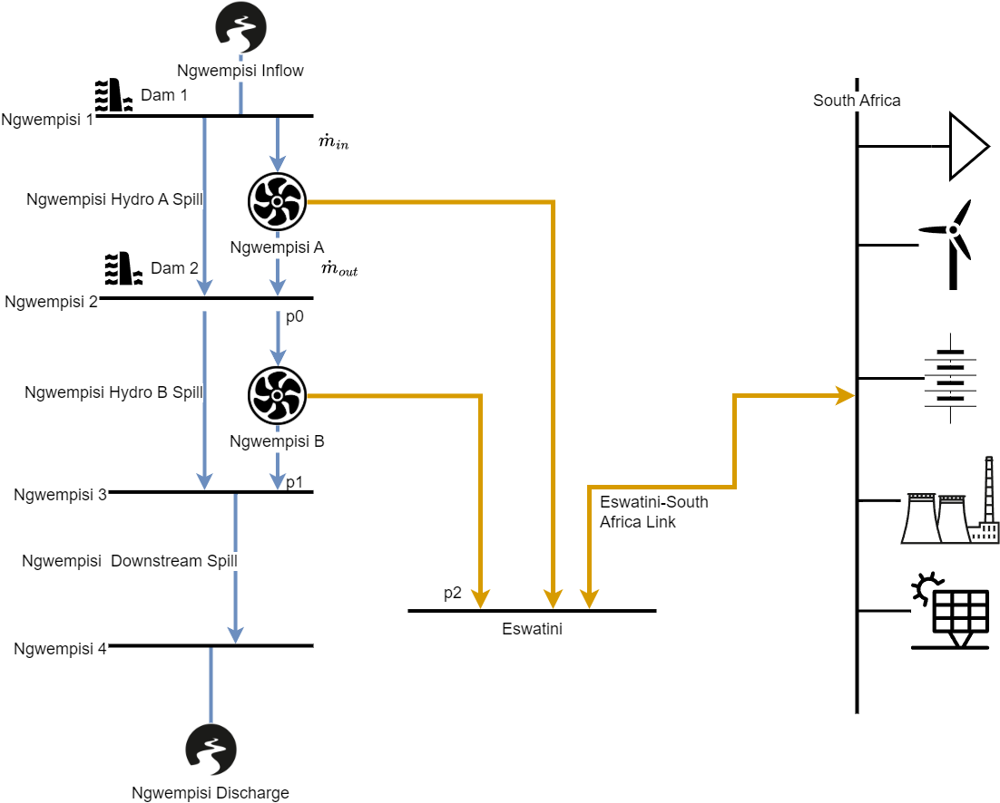

#### 📈 Market Model

In [18]:
# Google Colab users
# Remove the comments in the rows below to set up your notebook.

# from google.colab import drive
# import os

# drive.mount('/content/drive')
# os.chdir('/content/drive/MyDrive/psfo_2025/mec4131z/')

In [19]:
# from colab_scripts import install_colab_dependencies
# install_colab_dependencies()

In [20]:
import pypsa
import pandas as pd
import numpy as np
from training_scripts import *


In [21]:
input_file_name = 'data/Lesson7_ZA_Hydropower.xlsx'
path = convert_selected_sheets_to_csv(input_file_name, 'lesson7_csv_folder')

INFO:root:Converted carriers to CSV.
INFO:root:Converted buses to CSV.
INFO:root:Converted generators to CSV.
INFO:root:Converted links to CSV.
INFO:root:Converted storage_units to CSV.
INFO:root:Converted stores to CSV.
INFO:root:Converted loads to CSV.
INFO:root:Converted loads-p_set to CSV.
INFO:root:Converted snapshots to CSV.
INFO:root:Converted generators-p_max_pu to CSV.
INFO:root:Converted generators-p_set to CSV.
INFO:root:Conversion complete. CSV files are saved in 'lesson7_csv_folder'
INFO:root:Excel file closed successfully.


In [ ]:
network = pypsa.Network(path)


c:\Users\gosai\anaconda3\envs\flex_training_env\lib\site-packages\pypsa\io.py:1095: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

INFO:pypsa.io:Imported network lesson7_csv_folder has buses, carriers, generators, links, loads, storage_units, stores


In [23]:
network.optimize(solver_name='highs')

INFO:linopy.model: Solve problem using Highs solver
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:11<00:00,  1.26s/it]
INFO:linopy.io: Writing time: 116.7s
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 4907620 primals, 17614666 duals
Objective: 5.51e+11
Solver model: available
Solver message: optimal

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Generator-fix-p-ramp_limit_up, Generator-fix-p-ramp_limit_down, Generator-p_set, Link-fix-p-lower, Link-fix-p-upper, Store-fix-e-lower, Store-fix-e-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, StorageUnit-energy_balance, Store-energy_balance were not assigned to the

('ok', 'optimal')

In [24]:
network.links_t.p0.plot()

c:\Users\gosai\anaconda3\envs\flex_training_env\lib\site-packages\_plotly_utils\basevalidators.py:2596: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



```


```

In [25]:
# Define the carriers that should be committable
committable_carriers = ["coal", "gas", "biomass"]

# Step 1: Identify generators that produced power during the simulation
active_generators = network.generators_t.p.sum() > 0  # Sum over time and check if nonzero

# Step 2: Filter generators that belong to the selected carriers and were active
active_and_committable = network.generators.index[network.generators["carrier"].isin(committable_carriers) & active_generators]

# Step 3: Set 'committable' = True only for those generators
network.generators.loc[active_and_committable, "committable"] = True

###
---